In [1]:
import pandas
import pycaret
import numpy as np
import math
import smogn
import matplotlib.pyplot as plt
#from imblearn.over_sampling import SMOTE
#from sklearn.preprocessing import MinMaxScaler
#import smogn

from pycaret.regression import load_model

In [7]:
filename = "Data_2021_08_17_v1_m.csv"

In [51]:
#csv.to_csv("./Data_2021_08_13_v1_m.csv")

,N1,N2,d1,d2,freq,move_tx,move_rx,offset_tx,offset_rx,per,...,l1,l2,h1,w1,Lmr,I1,I2,N2s,offset,length4
0,-0.375387,1.066869,0.092798,-0.522797,40000,-0.697079,0.072607,-0.341791,-0.025855,-1.390497,...,-1.152037,1.497869,-1.410745,-1.555438,2.118629,0.660000,0.441787,256,3.0,2650.88
1,-0.375387,1.066869,0.579699,-0.289607,40000,1.042820,0.302100,0.336624,0.347071,0.150671,...,1.322220,1.211350,-0.917481,1.084531,16.844768,0.249000,0.165429,256,0.0,3841.28
2,-0.375387,1.066869,-1.182419,1.132851,40000,-1.531081,0.043920,1.432526,0.240521,0.998957,...,1.642417,0.160782,-0.609190,-0.794769,11.397761,0.237000,0.162938,256,11.5,2942.08
3,-0.375387,1.066869,-0.463660,0.946299,40000,0.970924,0.517250,-0.393977,-0.771707,-0.994397,...,1.496873,0.638313,0.562312,0.323862,8.763507,0.156000,0.089700,256,3.5,4080.64
4,-1.361592,-1.038166,-0.231803,-0.196331,40000,-1.487943,-1.447786,-2.011736,-2.423235,-1.672091,...,1.525982,-0.221243,0.562312,-0.347316,1.452086,0.791000,0.537485,64,3.5,1568.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87121,1.597023,-0.511907,-0.394103,0.246730,40000,-1.200356,0.459877,0.180067,-0.718431,1.617060,...,-0.424315,0.924831,0.007390,0.010646,4.128797,0.341543,0.701000,100,8.5,1950.40
87122,-1.361592,-1.038166,-1.321533,1.366041,40000,-1.286632,1.908552,-0.341791,0.027420,0.588835,...,-1.588671,-0.030231,-1.410745,-0.929004,1.430618,0.609000,0.380473,64,3.5,1407.60
87123,-1.361592,-1.038166,0.973857,-1.175728,40000,-0.251320,-0.429410,-0.915835,-0.452056,-0.524685,...,-0.744512,-0.603268,-0.794165,0.144881,2.130241,0.514000,0.454119,64,4.5,1576.72
87124,-1.361592,-1.038166,0.278284,-0.849262,40000,-0.136285,-0.931426,-2.585780,-2.742886,0.758259,...,-1.326690,1.593375,1.610498,1.353003,2.010069,0.242000,0.214170,64,1.0,1949.60


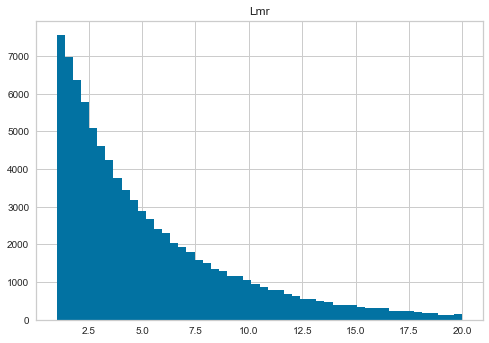

In [67]:
csv = pandas.read_csv(filename)
csv = csv.dropna(axis=0).reset_index(drop=True)#drop NaN

csv = csv[csv['Lmt']>0.1].reset_index(drop=True)
csv = csv[csv['Lmr']>0.1].reset_index(drop=True)
csv = csv[csv['k']>0].reset_index(drop=True)


#N1s = np.zeros(len(csv))
#N2s = np.zeros(len(csv))
#offset = np.zeros(len(csv))


"""

array_len = len(csv)

for i in range(0, array_len): 

    csv['I1'][i] = csv['I1'][i].replace('i', 'j')
    csv['I2'][i] = csv['I2'][i].replace('i', 'j')
    csv['I1'][i] = csv['I1'][i].replace(' ', '')
    csv['I2'][i] = csv['I2'][i].replace(' ', '')
    csv['I1'][i] = complex(csv['I1'][i]).real
    csv['I2'][i] = complex(csv['I2'][i]).real

    if csv['Lt'][i] > 100 and csv['Lt'][i]/csv['Lmt'][i] > 0.5:
        csv['Lt'][i] = csv['Lt'][i] * 1e-3
    if csv['Lr'][i] > 100 and csv['Lr'][i]/csv['Lmr'][i] > 0.5:
        csv['Lr'][i] = csv['Lr'][i] * 1e-3
    if csv['Lm'][i] > 100 and csv['Lmt'][i] > 50:
        csv['Lm'][i] = csv['Lm'][i] * 1e-3
    if csv['Lm'][i] > 100:
        csv['Lm'][i] = csv['Lm'][i] * 1e-3

csv['I1'] = pandas.to_numeric(csv['I1'], downcast="float")
csv['I2'] = pandas.to_numeric(csv['I2'], downcast="float")

"""



# extra parameter
N1s = csv["N1"].to_numpy() **2
N2s = csv["N2"].to_numpy() **2
offset = abs(csv["offset_tx"]-csv["offset_rx"])
N1N2 = N1s*N2s
sqrtN1N2 = np.sqrt(N1s*N2s)
sqrtN1N22 = np.sqrt(N1s*N2s)**2
space1_ex = csv["space1"].to_numpy() * csv["w1"].to_numpy()
space3_ex = csv["space3"].to_numpy() * csv["l1"].to_numpy() * 2
space2_ex = csv["space2"].to_numpy() * csv["w1"].to_numpy()
space4_ex = csv["space4"].to_numpy() * csv["l1"].to_numpy() * 2
space2_ex2 = csv["space2"].to_numpy() * csv["w1"].to_numpy() * csv["N1"].to_numpy() **2 * csv["N2"].to_numpy() **2  
space4_ex2 = csv["space4"].to_numpy() * csv["l1"].to_numpy() * 2 * csv["N1"].to_numpy() **2 * csv["N2"].to_numpy() **2  
length1 = csv["N1"].to_numpy() * (csv["l1"]*2 + csv["space1"]*2 + csv["w1"] + csv["space3"]*2)/2 + csv["N1"].to_numpy() * (csv["l1"]*2 + csv["space1"]*2 + csv["space5"] *2 + csv["w1"] + csv["space3"]*2)/2
length2 = csv["N1"].to_numpy() * (csv["l1"]*2 + csv["space2"]*2 + csv["w1"] + csv["space4"]*2)/2 + csv["N1"].to_numpy() * (csv["l2"]*2 + csv["space2"]*2 + csv["space6"] *2 + csv["w1"] + csv["space4"]*2)/2
length3 = csv["N2"].to_numpy() * (csv["l1"]*2 + csv["space1"]*2 + csv["w1"] + csv["space3"]*2)/2 + csv["N2"].to_numpy() * (csv["l1"]*2 + csv["space1"]*2 + csv["space5"] *2 + csv["w1"] + csv["space3"]*2)/2
length4 = csv["N2"].to_numpy() * (csv["l1"]*2 + csv["space2"]*2 + csv["w1"] + csv["space4"]*2)/2 + csv["N2"].to_numpy() * (csv["l2"]*2 + csv["space2"]*2 + csv["space6"] *2 + csv["w1"] + csv["space4"]*2)/2
window1 = (csv["l1"].to_numpy() * 2 + csv["space1"].to_numpy() *2) * (csv["w1"].to_numpy() + csv["space3"].to_numpy() *2)
window2 = (csv["l1"].to_numpy() * 2 + csv["space2"].to_numpy() *2) * (csv["w1"].to_numpy() + csv["space4"].to_numpy() *2)
from_l2 = (csv["l2"]).to_numpy() - (csv["space2"]).to_numpy() - (csv["space5"]).to_numpy()
corevolume = (4*csv["l1"].to_numpy() + 2*csv["l2"].to_numpy()) * csv["h1"].to_numpy() * csv["w1"].to_numpy() - 2 * csv["l2"].to_numpy() * csv["h1"].to_numpy() * csv["w1"].to_numpy()
corearea  = 2*csv["l1"].to_numpy() * csv["w1"].to_numpy()

#csv['sqrtN1N2'] = pandas.to_numeric(csv['sqrtN1N2'], downcast="float")





N1s = pandas.DataFrame(N1s,columns=["N1s"])
N2s = pandas.DataFrame(N2s,columns=["N2s"])
offset = pandas.DataFrame(offset,columns=["offset"])
#N1N2 = pandas.DataFrame(N1N2,columns=["N1N2"])
#sqrtN1N2 = pandas.DataFrame(sqrtN1N2,columns=["sqrtN1N2"])
#sqrtN1N22 = pandas.DataFrame(sqrtN1N22,columns=["sqrtN1N22"])
#space1_ex = pandas.DataFrame(space1_ex,columns=["space1_ex"])
#space3_ex = pandas.DataFrame(space3_ex,columns=["space3_ex"])
#space2_ex = pandas.DataFrame(space2_ex,columns=["space2_ex"])
#space4_ex = pandas.DataFrame(space4_ex,columns=["space4_ex"])
#space2_ex2 = pandas.DataFrame(space2_ex2,columns=["space2_ex2"])
#space4_ex2 = pandas.DataFrame(space4_ex2,columns=["space4_ex2"])
length1 = pandas.DataFrame(length1,columns=["length1"])
#length2 = pandas.DataFrame(length2,columns=["length2"])
#length3 = pandas.DataFrame(length3,columns=["length3"])
length4 = pandas.DataFrame(length4,columns=["length4"])
#window1 = pandas.DataFrame(window1,columns=["window1"])
#window2 = pandas.DataFrame(window2,columns=["window2"])
#from_l2 = pandas.DataFrame(from_l2,columns=["from_l2"])
#corevolume = pandas.DataFrame(corevolume,columns=["corevolume"])
#corearea = pandas.DataFrame(corearea ,columns=["corearea"])
 
csv = pandas.concat([csv,N2s,offset,length4],axis=1)



array_len = len(csv)

R1 = np.zeros(array_len)
R2 = np.zeros(array_len)

for i in range(0, array_len): 
    R1[i] = csv['copperloss_tx'][i]/csv['I1'][i]/csv['I1'][i]
    R2[i] = csv['copperloss_rx'][i]/csv['I2'][i]/csv['I2'][i]

csv = csv.assign(R1 = R1)
csv = csv.assign(R2 = R2)


csv2 = csv





# N1,N2,d1,d2,freq,move_tx,move_rx,offset_tx,offset_rx,per,space1,space2,space3,space4,space5,space6,l1,l2,h1,w1,Lmt,Lmr,Llt,Llr,k,Lt,Lr,Lm,Rt,Rr,I1,I2,Zt,Zr,Zm,copperloss_tx,copperloss_rx




#csv = csv[csv['copperloss_tx'] < 1000]
#csv = csv[csv['copperloss_rx'] < 1000]

csv = csv[csv['Lmr'] < 20]
csv = csv[csv['Lmr'] > 1]
#csv = csv[csv['Lmr'] < 10]
#csv = csv[csv['Lmr'] > 3]
#csv = csv[csv['Llr'] < 100]
#csv = csv[csv['Llr'] > 3]






#csv = csv[csv['Lr'] < 20]

# normalize data

csv["N1"] = (csv["N1"] - csv.describe().iloc[1,:][0])/csv.describe().iloc[2,:][0]
csv["N2"] = (csv["N2"] - csv.describe().iloc[1,:][1])/csv.describe().iloc[2,:][1]
csv["d1"] = (csv["d1"] - csv.describe().iloc[1,:][2])/csv.describe().iloc[2,:][2]
csv["d2"] = (csv["d2"] - csv.describe().iloc[1,:][3])/csv.describe().iloc[2,:][3]
#csv["freq"] = (csv["freq"] - csv.describe().iloc[1,:][5])/csv.describe().iloc[2,:][5]
csv["move_tx"] = (csv["move_tx"] - csv.describe().iloc[1,:][5])/csv.describe().iloc[2,:][5]
csv["move_rx"] = (csv["move_rx"] - csv.describe().iloc[1,:][6])/csv.describe().iloc[2,:][6]
csv["offset_tx"] = (csv["offset_tx"] - csv.describe().iloc[1,:][7])/csv.describe().iloc[2,:][7]
csv["offset_rx"] = (csv["offset_rx"] - csv.describe().iloc[1,:][8])/csv.describe().iloc[2,:][8]
csv["per"] = (csv["per"] - csv.describe().iloc[1,:][9])/csv.describe().iloc[2,:][9]
csv["space1"] = (csv["space1"] - csv.describe().iloc[1,:][10])/csv.describe().iloc[2,:][10]
csv["space2"] = (csv["space2"] - csv.describe().iloc[1,:][11])/csv.describe().iloc[2,:][11]
csv["space3"] = (csv["space3"] - csv.describe().iloc[1,:][12])/csv.describe().iloc[2,:][12]
csv["space4"] = (csv["space4"] - csv.describe().iloc[1,:][13])/csv.describe().iloc[2,:][13]
csv["space5"] = (csv["space5"] - csv.describe().iloc[1,:][14])/csv.describe().iloc[2,:][14]
csv["space6"] = (csv["space6"] - csv.describe().iloc[1,:][15])/csv.describe().iloc[2,:][15]
csv["l1"] = (csv["l1"] - csv.describe().iloc[1,:][16])/csv.describe().iloc[2,:][16]
csv["l2"] = (csv["l2"] - csv.describe().iloc[1,:][17])/csv.describe().iloc[2,:][17]
csv["h1"] = (csv["h1"] - csv.describe().iloc[1,:][18])/csv.describe().iloc[2,:][18]
csv["w1"] = (csv["w1"] - csv.describe().iloc[1,:][19])/csv.describe().iloc[2,:][19]

'''
csv["N1s"] = (csv["N1s"] - csv.describe().iloc[3,:][24])/(csv.describe().iloc[7,:][24]-csv.describe().iloc[3,:][24])
csv["N2s"] = (csv["N2s"] - csv.describe().iloc[3,:][25])/(csv.describe().iloc[7,:][25]-csv.describe().iloc[3,:][25])
csv["offset"] = (csv["offset"] - csv.describe().iloc[1,:][26])/csv.describe().iloc[2,:][26]
#csv["sqrtN1N22"] = (csv["sqrtN1N22"] - csv.describe().iloc[1,:][27])/csv.describe().iloc[2,:][27]
csv["space2_ex"] = (csv["space2_ex"] - csv.describe().iloc[1,:][28])/csv.describe().iloc[2,:][28]
csv["space4_ex"] = (csv["space4_ex"] - csv.describe().iloc[1,:][29])/csv.describe().iloc[2,:][29]
'''

#csv = csv[csv['R2'] < 0.15]
#csv = csv[csv['R2'] > 0.03]
#csv = csv[csv['R2'] < 0.15]

csv = csv.drop('Rt',axis=1)
csv = csv.drop('Rr',axis=1)
csv = csv.drop('Zt',axis=1)
csv = csv.drop('Zr',axis=1)
csv = csv.drop('Zm',axis=1)
csv = csv.drop('Lmt',axis=1)
#csv = csv.drop('Lmr',axis=1)
csv = csv.drop('Llt',axis=1)
csv = csv.drop('Llr',axis=1)
csv = csv.drop('k',axis=1)
csv = csv.drop('Lt',axis=1)
csv = csv.drop('Lr',axis=1)
csv = csv.drop('Lm',axis=1)
csv = csv.drop('copperloss_tx',axis=1)
csv = csv.drop('copperloss_rx',axis=1)
csv = csv.drop('R1',axis=1)
csv = csv.drop('R2',axis=1)

dataset = csv
dataset = dataset.dropna(axis=0).reset_index(drop=True)



dataset.hist('Lmr',bins=50)
#dataset.hist('I2',bins=50)

dataset.describe()
dataset

#csv2


In [68]:
data = dataset.sample(frac=0.9, random_state=786).reset_index(drop=True)
data_unseen = dataset.drop(data.index).reset_index(drop=True)


print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

#data.to_csv("./train_data.csv")

Data for Modeling: (78413, 26)
Unseen Data For Predictions: (8713, 26)


In [69]:
from pycaret.regression import *
exp_reg101 = setup(data = data, target = 'Lmr', session_id=123, silent=True, use_gpu=False) 

,Description,Value
0,session_id,123
1,Target,Lmr
2,Original Data,"(78413, 26)"
3,Missing Values,False
4,Numeric Features,23
5,Categorical Features,2
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(54889, 31)"


In [70]:
# top3 = [ create_model(name) for name in ["xgboost","lightgbm", "rf"] ]
#top3 = compare_models(n_select = 3) 
#best5 = create_model('lightgbm',num_leaves=60, max_depth=20, min_data_in_leaf=20) # default num_leave : 31 / max_depth = -1 / min_data_in_leaf = 20
#best5 = create_model('mlp')
#best5 = create_model('gbr')
#lgbm = create_model('lightgbm',num_leaves=60, max_depth=20, min_data_in_leaf=20) # default num_leave : 31 / max_depth = -1 / min_data_in_leaf = 20
lgbm = create_model('lightgbm',num_leaves=40)
#et = create_model('et')
#rf = create_model('rf')
#top3 = [lgbm, et, rf]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.2544,0.1712,0.4138,0.9895,0.0573,0.0576
1,0.2420,0.1319,0.3632,0.9920,0.0540,0.0556
2,0.2461,0.1538,0.3921,0.9897,0.0593,0.0579
3,0.2534,0.1765,0.4201,0.9887,0.0628,0.0591
4,0.2451,0.1250,0.3536,0.9919,0.0551,0.0579
5,0.2534,0.1452,0.3810,0.9910,0.0556,0.0584
6,0.2517,0.1370,0.3702,0.9911,0.0567,0.0589
7,0.2482,0.1331,0.3648,0.9914,0.0558,0.0579
8,0.2487,0.1618,0.4022,0.9896,0.0610,0.0601
9,0.2444,0.1398,0.3739,0.9911,0.0549,0.0565


In [71]:
#tuned_top3 = [tune_model(i) for i in top3]

In [72]:
#bagged_top3 = [ensemble_model(i) for i in top3]


In [73]:
#tuned_model = tune_model(best5, optimize = 'MSE')

In [74]:
#blender = blend_models(estimator_list = top3)

In [75]:
#stacked = stack_models(estimator_list=top3)

In [76]:
#automl = automl(optimize = 'RMSE')

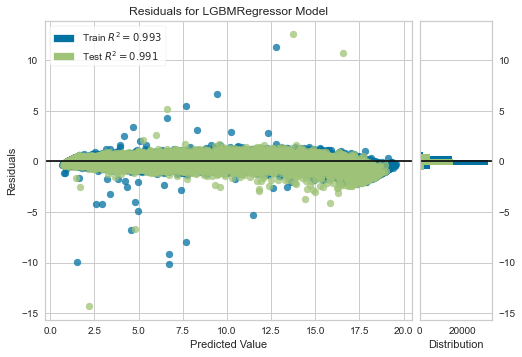

In [77]:
plot_model(estimator = lgbm, plot='residuals')
#plot_model(tuned_model)

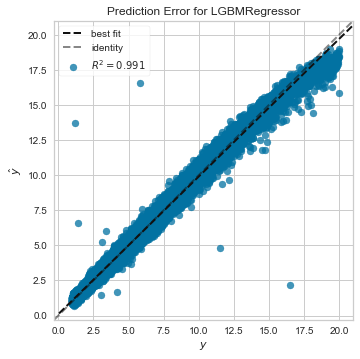

In [78]:
plot_model(estimator = lgbm, plot='error')

In [79]:
evaluate_model(automl)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [80]:
lgbm

LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=40, objective=None,
              random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [81]:
#plot_model(estimator = best5, plot='rfe')

In [82]:
plot_model(estimator = best5, plot = 'feature_all')

NameError: name 'best5' is not defined

In [ ]:
evaluate_model(best5)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [83]:
save_model(lgbm, "ML_model2_v3_2021_08_17_v1_Lmr")

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='Lmr',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy='m...
                  LGBMRegressor(boosting_type='gbdt', class_weight=None,
                                colsample_bytree=1.0, importance_type='split',
                                learning_rate=0.1, max_depth=-1,
                                min_child_samples=20, min_child_weight=0.001,
                  